In [1]:
# import bin2cell as b2c
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import math
import numpy as np

from matplotlib.colors import ListedColormap
from stardist.models import StarDist2D
from csbdeep.utils import normalize
from glob import glob

2024-09-10 15:03:03.174503: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-09-10 15:03:03.214246: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [81]:
def create_palette_matplotlib(n):
    cmap = plt.get_cmap('hsv')  # Puoi cambiare 'hsv' con qualsiasi colormap disponibile in matplotlib
    colors = [cmap(i / n) for i in range(n)]
    colors = [(1, 1, 1, 1)] + colors
    return ListedColormap(colors)

def create_palette_uniform(n):
    colors = [(0, 0, 0, 0)] + ['yellow' for x in range(n)]
    return ListedColormap(colors)

In [3]:
#from stardist.models import StarDist2D
model = StarDist2D.from_pretrained('2D_versatile_he')

Found model '2D_versatile_he' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.692478, nms_thresh=0.3.


In [4]:
Cyt_Human_path = "/beegfs/scratch/ric.cirillo.transcriptomics/ric.cirillo.transcriptomics/proveHD/Granulomas_Tiff_High_quality/Cyt_Human/"

In [5]:
Cyt_Human_imgs = glob(Cyt_Human_path+"*.tif")

In [6]:
# reorder
Cyt_Human_imgs = [Cyt_Human_imgs[1]] + [Cyt_Human_imgs[0]] + Cyt_Human_imgs[2:6]

In [7]:
Cyt_Human_imgs

['/beegfs/scratch/ric.cirillo.transcriptomics/ric.cirillo.transcriptomics/proveHD/Granulomas_Tiff_High_quality/Cyt_Human/981 A6_Ctrl_oldHE.tif',
 '/beegfs/scratch/ric.cirillo.transcriptomics/ric.cirillo.transcriptomics/proveHD/Granulomas_Tiff_High_quality/Cyt_Human/981 A6 HE_ctrl.tif',
 '/beegfs/scratch/ric.cirillo.transcriptomics/ric.cirillo.transcriptomics/proveHD/Granulomas_Tiff_High_quality/Cyt_Human/981 A6_InflArea_oldHE.tif',
 '/beegfs/scratch/ric.cirillo.transcriptomics/ric.cirillo.transcriptomics/proveHD/Granulomas_Tiff_High_quality/Cyt_Human/981 A6 HE-001_inflArea.tif',
 '/beegfs/scratch/ric.cirillo.transcriptomics/ric.cirillo.transcriptomics/proveHD/Granulomas_Tiff_High_quality/Cyt_Human/981 A6_Granuloma_oldHE.tif',
 '/beegfs/scratch/ric.cirillo.transcriptomics/ric.cirillo.transcriptomics/proveHD/Granulomas_Tiff_High_quality/Cyt_Human/981 A6 HE_ granuloma.tif']

In [8]:
img_N = len(Cyt_Human_imgs)
img_list = [None for x in range(img_N)]
for x in range(img_N):
    img_list[x]=mpimg.imread(Cyt_Human_imgs[x])

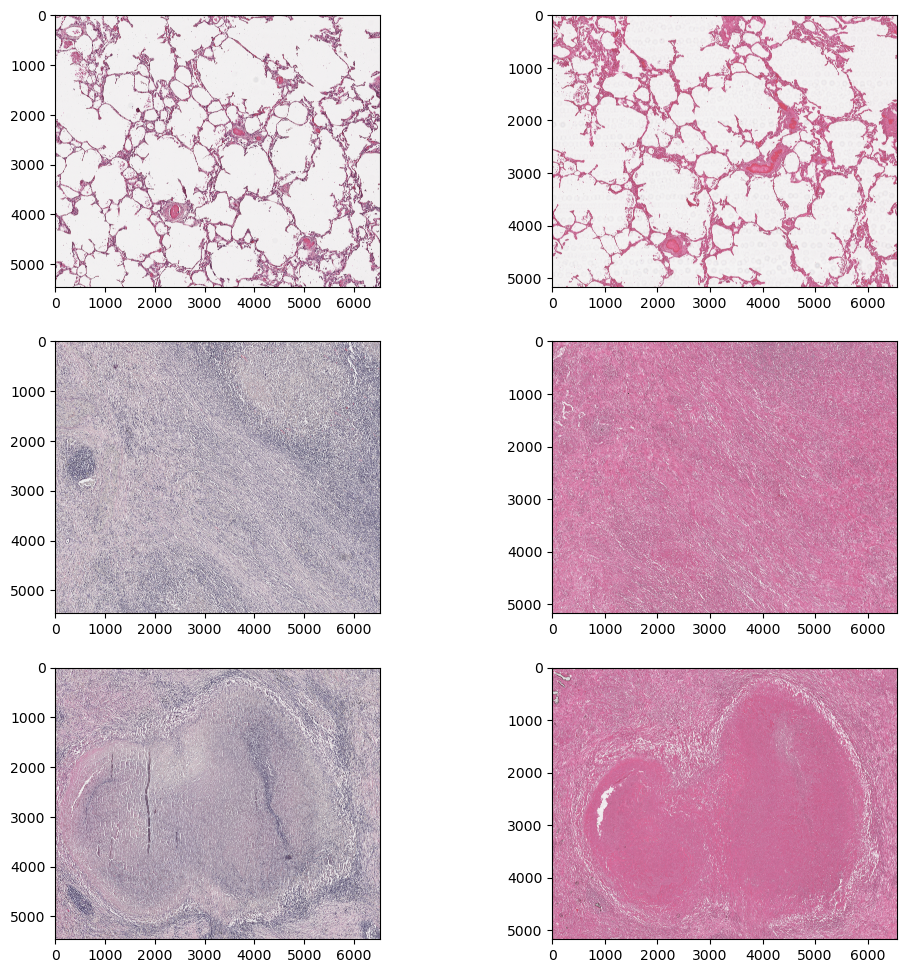

In [9]:
fig, ax = plt.subplots(math.ceil(img_N/2), 2)
fig.set_size_inches(12, 12)
for x in range(img_N):
    ax[math.floor(x/2), x%2].imshow(img_list[x])

In [10]:
#b2c.stardist(image_path=imgpath+"Cyt_Human/981 A6_Ctrl_oldHE.tif", 
#             labels_npz_path=imgpath+"Cyt_Human/981 A6_Ctrl_oldHE.npz", 
#             stardist_model="2D_versatile_he", 
#             prob_thresh=0.1
#            )

In [11]:
img_N = len(Cyt_Human_imgs)
labels_def = [None for x in range(img_N)]
polys_def = [None for x in range(img_N)]
for x in range(img_N):
    labels_def[x], polys_def[x] = model.predict_instances(normalize(img_list[x]))#, prob_thresh= 0.8,nms_thresh= 0.3)

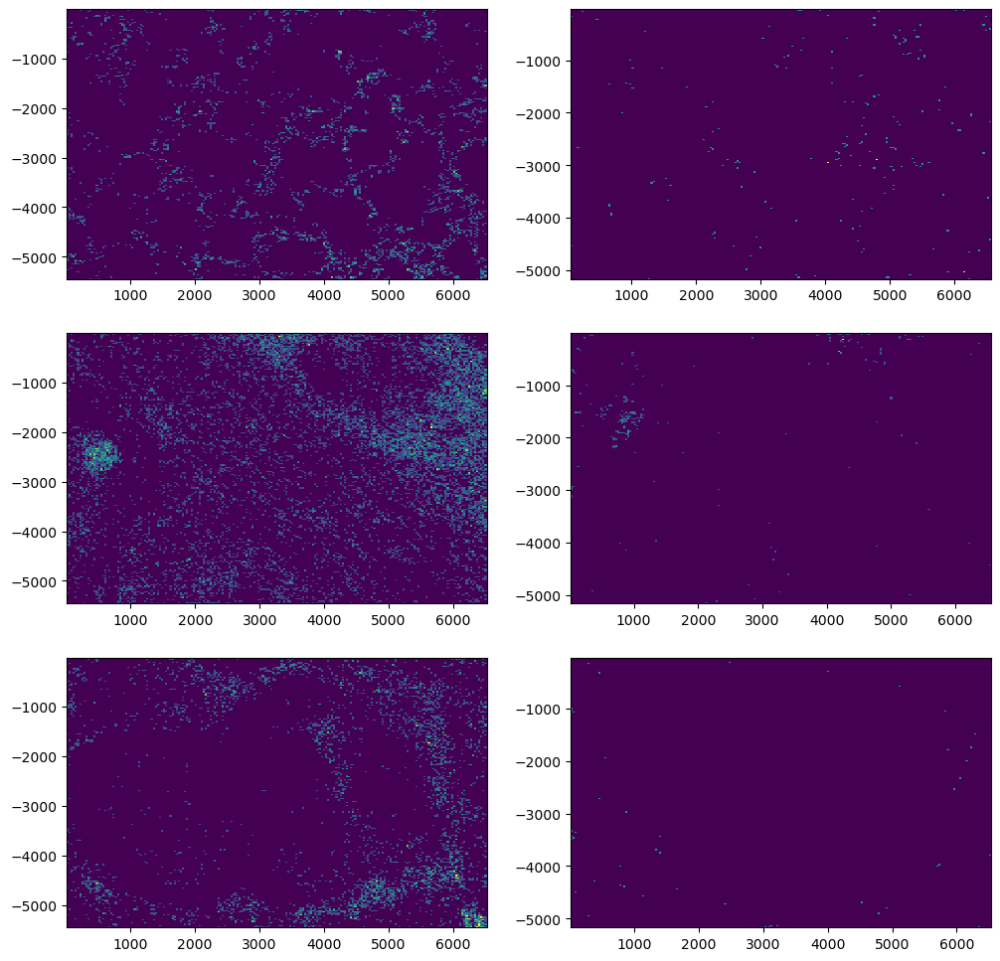

In [12]:
fig, ax = plt.subplots(math.ceil(img_N/2), 2)
fig.set_size_inches(12, 12)
for x in range(img_N):
    y_coords = [-k[0] for k in polys_def[x]['points']]
    x_coords = [k[1] for k in polys_def[x]['points']]
    ax[math.floor(x/2), x%2].hist2d(x_coords, y_coords, 200)

## change parameteres

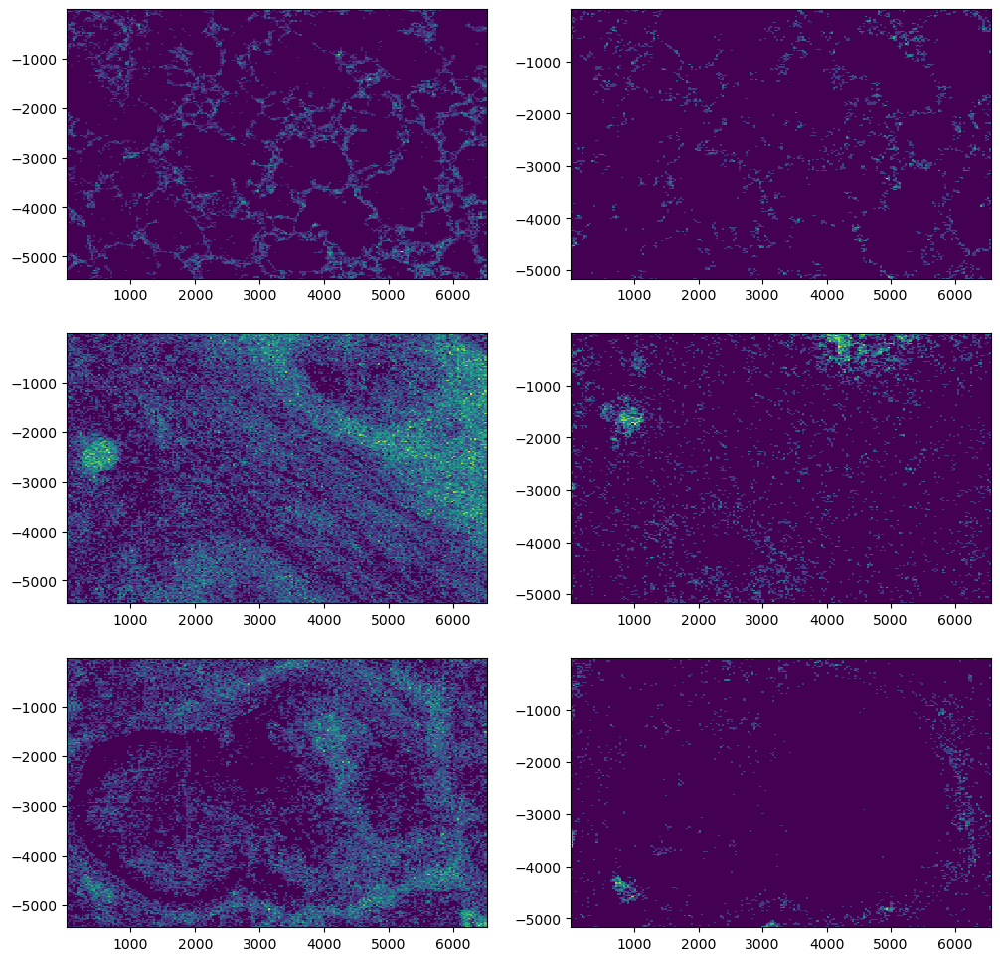

In [13]:
img_N = len(Cyt_Human_imgs)
labels_01 = [None for x in range(img_N)]
polys_01 = [None for x in range(img_N)]
for x in range(img_N):
    labels_01[x], polys_01[x] = model.predict_instances(normalize(img_list[x]), prob_thresh= 0.1)

fig, ax = plt.subplots(math.ceil(img_N/2), 2)
fig.set_size_inches(12, 12)
for x in range(img_N):
    y_coords = [-k[0] for k in polys_01[x]['points']]
    x_coords = [k[1] for k in polys_01[x]['points']]
    ax[math.floor(x/2), x%2].hist2d(x_coords, y_coords, 200)

In [76]:
import matplotlib.patches as patches
from stardist import random_label_cmap, _draw_polygons

def show_cropped_nuclei(img, labels, details=None, 
                        x_bottom=0, y_bottom=0, x_width=500, y_width=500, probs=True):

    bbox = (x_bottom, y_bottom, x_bottom+x_width, y_bottom+y_width)
    
    nuclei_matrix = (labels > 0).astype(int)
    cropped = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    cropped_nuclei = labels[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    cropped_mask = nuclei_matrix[bbox[1]:bbox[3], bbox[0]:bbox[2]]

    # identify cropped ids
    cropped_nuclei_ids = set(np.unique(cropped_nuclei)).difference([0])
    cropped_nuclei_idx = np.array(list(cropped_nuclei_ids)) - 1

    # select details of the cropped nuclei and translate according to new coordinates
    coord, points, prob = details['coord'], details['points'], details['prob']    
    coord = [[coord[idx][0] - x_bottom, coord[idx][1] - y_bottom] for idx in cropped_nuclei_idx]
    points = [points[idx] - [x_bottom, y_bottom] for idx in cropped_nuclei_idx]
    prob = [prob[idx] for idx in cropped_nuclei_idx]

    # panel 1 - full image with red rectangle on the selection

    fig, axes = plt.subplots(1, 2, figsize=(20, 20)) 
    axes[0].imshow(img)
    # Create a Rectangle patch and add the patch to the Axes
    rect = patches.Rectangle((x_bottom, y_bottom), x_width, y_width, linewidth=1, edgecolor='r', facecolor='none')
    axes[0].add_patch(rect)
    
    plt.subplot(122); plt.imshow(cropped); plt.axis('off')
    a = plt.axis()
    if probs != True:
        prob = None
    _draw_polygons(polygons = coord,
                   scores = prob, 
                   show_dist=False, 
                   cmap = create_palette_uniform(len(coord))
                  )
    plt.axis(a)



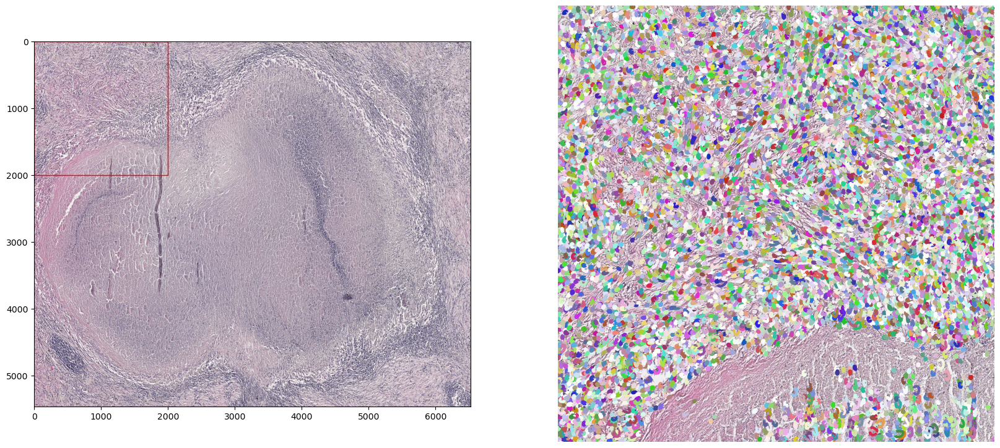

In [42]:
show_cropped_nuclei(img_list[4], labels_001[4], polys_001[4], 0, 0, 2000, 2000)

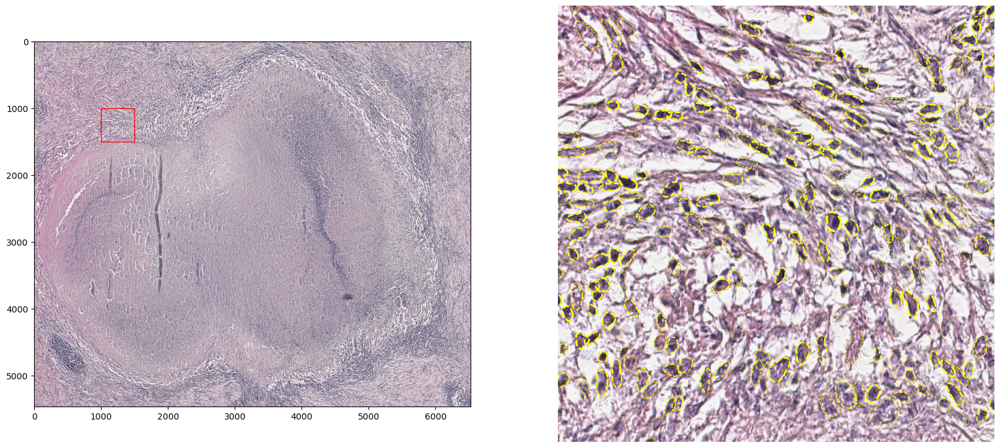

In [83]:
show_cropped_nuclei(img_list[4], labels_01[4], polys_01[4], 1000, 1000, 500, 500)

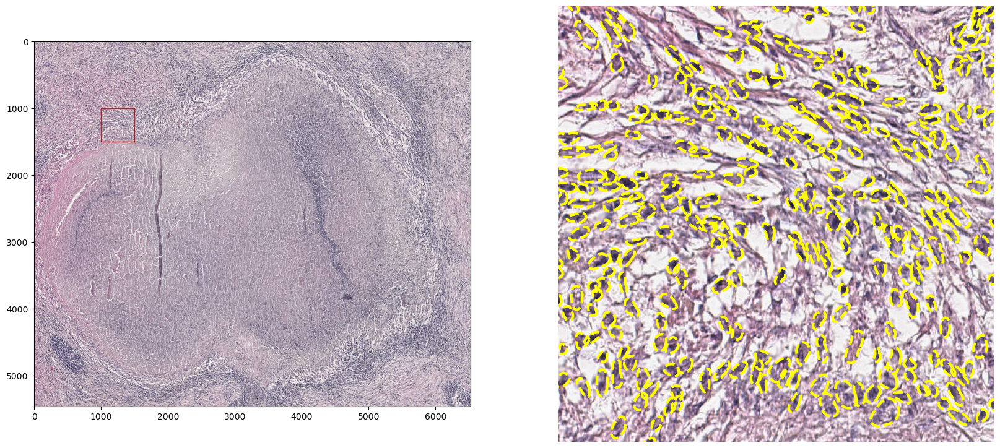

In [82]:
show_cropped_nuclei(img_list[4], labels_01[4], polys_01[4], 1000, 1000, 500, 500, probs=False)

In [31]:
def show_cropped_nuclei(img, labels, x_bottom=0, y_bottom=0, x_width=500, y_width=500, alpha = 0.3):
    
    nuclei_matrix = (labels > 0).astype(int)
    
    bbox = (x_bottom, y_bottom, x_bottom+x_width, y_bottom+y_width)
    
    cropped = img[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    cropped_nuclei = labels[bbox[1]:bbox[3], bbox[0]:bbox[2]]
    cropped_mask = nuclei_matrix[bbox[1]:bbox[3], bbox[0]:bbox[2]]

    # Create a Rectangle patch
    rect = patches.Rectangle((x_bottom, y_bottom), x_width, y_width, linewidth=1, edgecolor='r', facecolor='none')
    
    fig, axes = plt.subplots(1, 3, figsize=(20, 20)) 
    axes[0].imshow(img)
    # Add the patch to the Axes
    axes[0].add_patch(rect)
    axes[1].imshow(cropped)
    axes[1].imshow(cropped_mask, alpha = alpha)
    axes[2].imshow(cropped_nuclei, cmap = create_palette_matplotlib(len(np.unique(cropped_nuclei))-1))

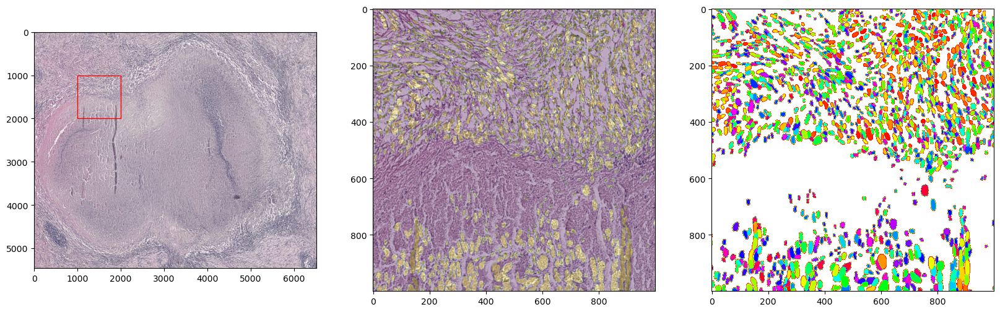

In [33]:
show_cropped_nuclei(img_list[4], labels_001[4], 1000, 1000, 1000, 1000)